In [1]:
# CSC 732 Final Part 1 Problem 2 Relu Softmax SGD Test Case
# Dominic Klusek, Jonathan Rozen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))

<h2>Dataset Information</h2>
<p>Beginner set of 16,000 custom images for categorizing polyhedral dice. 
    Polyhedral dice vary in color, and images are taken at different angles over different background types: blank, colored, and wood. All images were created, edited, and sorted by Mario Lurig.

Fixed camera positions (minimum 2 angles) used to capture video on a rotating platform with two white lights
Minimum 5 different dice used on 6 different backgrounds (white and various colors)
Video was then exported as images and then batch cropped to 480x480
Handheld camera moved over 5+ dice on various wood surfaces (minimum 2) using natural lighting
Video edited and exported to images then batch cropped to 480x480
Images that were partially out of crop were manually removed
</p>

<ul>
    <li><strong>Number of Instances: </strong>16,000</li>
    <li><strong>Number of Classes: </strong>6</li>
    <li><strong>Image Dimensions: </strong>480x480</li>
    <li><strong>Number of Channels: </strong>3</li>
</ul>

In [2]:
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import Conv2D, MaxPooling2D 
from keras.layers.core import Flatten, Dropout, Dense, Activation
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras.optimizers import SGD
from keras import backend as K
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle

Using TensorFlow backend.


In [3]:
# set some hyper parameters for training
batch_size = 32
num_classes = 6
num_epochs = 40

In [4]:
train_dir = 'Datasets/Dice/train/'
test_dir = 'Datasets/Dice/test/'
validation_dir = 'Datasets/Dice/val/'

In [5]:
# build the model
model = Sequential()
model.add(Conv2D(32, (3, 3), kernel_initializer='glorot_uniform', input_shape=(150, 150, 3)))
#model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(rate=0.2))
model.add(Conv2D(64, (3, 3), kernel_initializer='glorot_uniform'))
#model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(rate=0.2))
model.add(Conv2D(128, (3, 3), kernel_initializer='glorot_uniform'))
#model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(rate=0.2))
model.add(Conv2D(128, (3, 3), kernel_initializer='glorot_uniform'))
#model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(rate=0.2))
model.add(Flatten())
model.add(Dense(512, activation='relu', kernel_initializer='glorot_uniform', use_bias=False))
model.add(BatchNormalization())
model.add(Dropout(rate=0.2))
model.add(Dense(6, activation='softmax', kernel_initializer='glorot_uniform'))

In [6]:
# compile the model to use binary crossentropy and use RMSProp optimizer
model.compile(loss='categorical_crossentropy',optimizer=SGD(momentum=0.9, nesterov=True),metrics=['acc'])

In [7]:
# create image generators
# each using the images from their respective directories
train_datagen = ImageDataGenerator(
rescale=1./255.,
rotation_range=40,
width_shift_range=0.2,
height_shift_range=0.2,
shear_range=0.2,
zoom_range=0.2)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
train_dir,
target_size=(150, 150),
batch_size=batch_size,
class_mode='categorical')

test_generator = train_datagen.flow_from_directory(
test_dir,
target_size=(150, 150),
batch_size=batch_size,
class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
validation_dir,
target_size=(150, 150),
batch_size=batch_size,
class_mode='categorical')

Found 6600 images belonging to 6 classes.
Found 1200 images belonging to 6 classes.
Found 1800 images belonging to 6 classes.


In [8]:
# fit the model to the image created by the generators
history = model.fit_generator(
train_generator,
steps_per_epoch=100,
epochs=num_epochs,
validation_data=validation_generator,
validation_steps=100, callbacks=[keras.callbacks.ModelCheckpoint('best_model_less_sgd.h5', save_best_only=True)])

Epoch 1/40
100/100 [==============================] - 47s 467ms/step - loss: 1.9165 - acc: 0.2453 - val_loss: 1.8498 - val_acc: 0.2015
Epoch 2/40
100/100 [==============================] - 40s 399ms/step - loss: 1.7412 - acc: 0.2894 - val_loss: 2.0578 - val_acc: 0.1694
Epoch 3/40
100/100 [==============================] - 31s 314ms/step - loss: 1.7763 - acc: 0.2475 - val_loss: 5.9596 - val_acc: 0.2265
Epoch 4/40
100/100 [==============================] - 29s 294ms/step - loss: 1.7958 - acc: 0.2591 - val_loss: 2.1690 - val_acc: 0.1885
Epoch 5/40
100/100 [==============================] - 30s 298ms/step - loss: 1.7629 - acc: 0.2822 - val_loss: 3.2825 - val_acc: 0.1622
Epoch 6/40
100/100 [==============================] - 30s 303ms/step - loss: 1.7176 - acc: 0.2887 - val_loss: 2.0329 - val_acc: 0.2462
Epoch 7/40
100/100 [==============================] - 30s 295ms/step - loss: 1.7194 - acc: 0.2972 - val_loss: 3.3533 - val_acc: 0.1659
Epoch 8/40
100/100 [==============================] - 2

In [9]:
# save the model for future use 
model.save('dice_relu_softmax_SGD_less_steps.h5')

In [10]:
#model.load_weights('cats_and_dogs_relu_sigmoid_Adam.h5')
# Evaluate classifier with test image generator
evaluation = model.evaluate_generator(test_generator, steps=400, verbose=1)
print("Test Loss: %.4f" % evaluation[0])
print("Test Accuracy: %.4f" % evaluation[1])

400/400 [==============================] - 95s 237ms/step
Test Loss: 1.3496
Test Accuracy: 0.4045


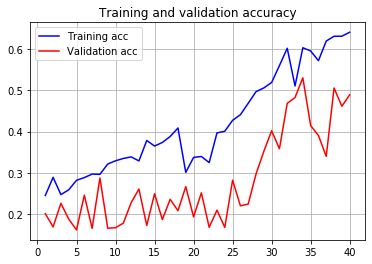

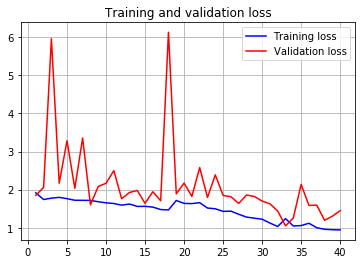

In [11]:
# plot accuracy and loss plots
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.figure(facecolor='w')
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.grid()
plt.figure(facecolor='w')
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.grid()
plt.show()

<h2>Visual Activation Maps</h2>

In [12]:
from keras.preprocessing import image
import numpy as np

#create list of randomly augmented images of dice
dice_images = []

for i in range(2):
    img = image.load_img("val/d4/d4_angle_color015.jpg", target_size=(150,150))
    img_tensor = image.img_to_array(img)
    img_tensor = train_datagen.apply_transform(img_tensor, train_datagen.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

for i in range(2):
    img = image.load_img("val/d6/d6_off-angle_181.jpg", target_size=(150,150))
    img_tensor = image.img_to_array(img)
    img_tensor = train_datagen.apply_transform(img_tensor, train_datagen.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

for i in range(2):
    img = image.load_img("val/d8/d8_wood940.jpg", target_size=(150,150))
    img_tensor = image.img_to_array(img)
    img_tensor = train_datagen.apply_transform(img_tensor, train_datagen.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

for i in range(2):
    img = image.load_img("val/d12/d12_top202.jpg", target_size=(150,150))
    img_tensor = image.img_to_array(img)
    img_tensor = train_datagen.apply_transform(img_tensor, train_datagen.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

for i in range(2):
    img = image.load_img("val/d20/d20_color498.jpg", target_size=(150,150))
    img_tensor = image.img_to_array(img)
    img_tensor = train_datagen.apply_transform(img_tensor, train_datagen.get_random_transform(img_tensor.shape))
    img_tensor = np.expand_dims(img_tensor,axis=0)
    img_tensor/=255
    dice_images.append(img_tensor)

In [13]:
from keras import models
layer_outputs = [layer.output for layer in model.layers]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

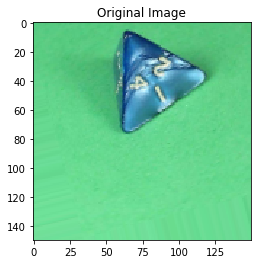

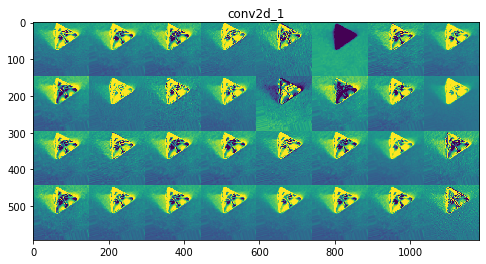

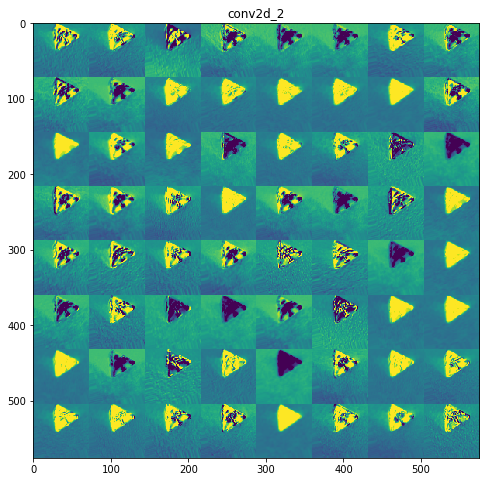

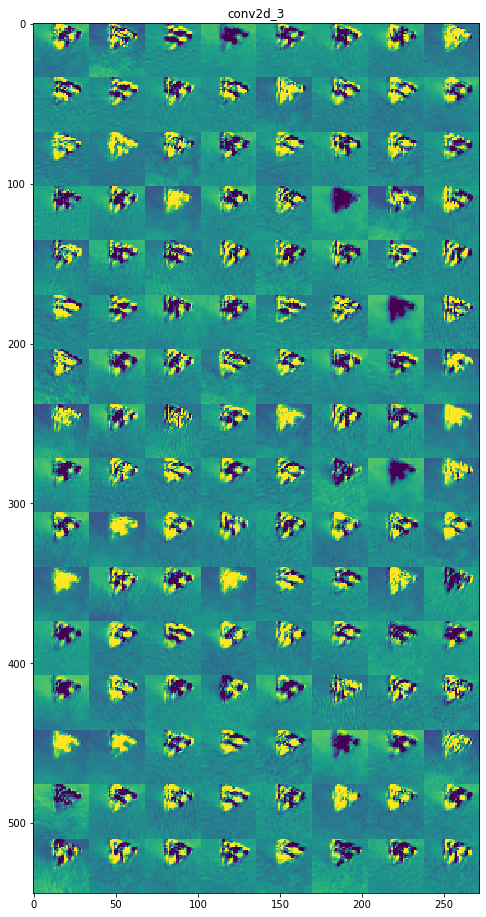

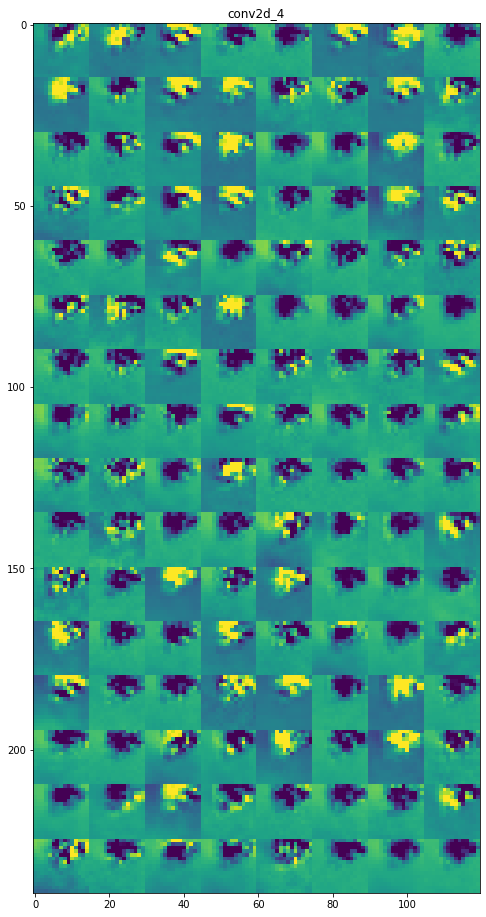

...

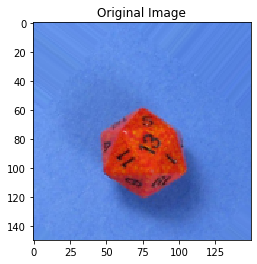

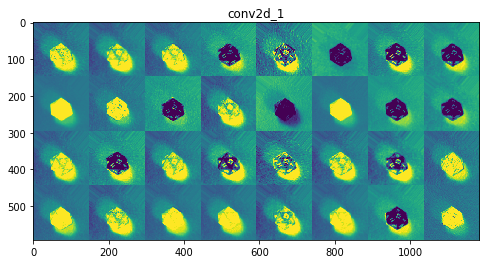

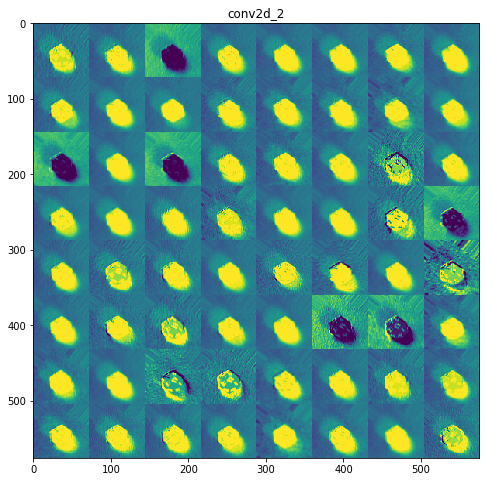

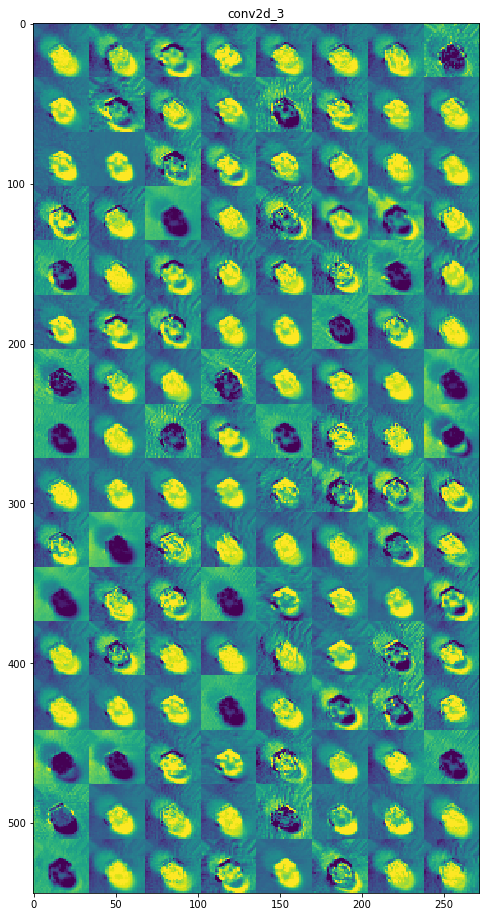

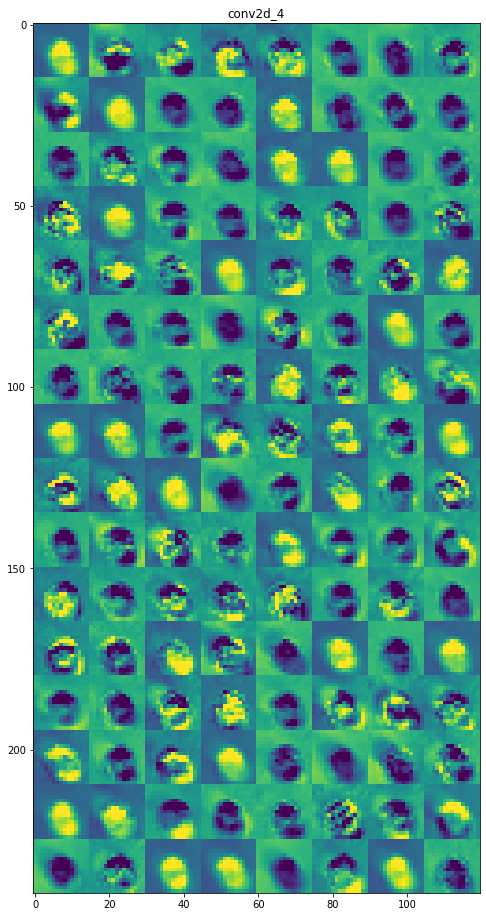

In [14]:
import numpy as np
import time
for img in dice_images:
    plt.title("Original Image")
    plt.imshow(img[0])
    activations = activation_model.predict(img)
    layer_names = [layer.name for layer in model.layers]
    images_per_row = 8

    for layer_name, layer_activation in zip(layer_names, activations):
        # skiip none convolutional layers
        if(layer_name.find('conv') == -1):
            continue
        n_features = layer_activation.shape[-1]
    
        size = layer_activation.shape[1]
    
        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))

        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,:, :,col * images_per_row + row]
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image 

        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],scale * display_grid.shape[0]), facecolor='w')
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show()

<p>Visualizing the activation maps when the CNN makes a prediction is a good way to visualize the type of data that is being collected and how it is abstracted by later layers. For instance when we look at the first layer conv2d_1 seems to collect some fur texture, silhouette, contours, and other such data; then conv2d_2 collects similar data, then for other layers the data becomes more generalized and abstract compared to the first 2 layers due to the dimensionality reduction. We can also see all the filters that do not contribute much or those that have been set to 0 by the dropout function.</p>

<h2>Visualizing Filters</h2>

In [15]:
def deprocess_image(x):
    """utility function to convert a float array into a valid uint8 image.

    # Arguments
        x: A numpy-array representing the generated image.

    # Returns
        A processed numpy-array, which could be used in e.g. imshow.
    """
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [16]:
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    #print(layer_output.shape)
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    #print(input_img_data.shape)
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    img = input_img_data[0]
    return deprocess_image(img)

In [17]:
#model = load_model('cats_and_dogs_small_2.h5')
layer_names = [layer.name for layer in model.layers]
layer_output = model.get_layer(layer_names[0]).output
print(layer_names)
print(len(layer_names))

['conv2d_1', 'activation_1', 'max_pooling2d_1', 'dropout_1', 'conv2d_2', 'activation_2', 'max_pooling2d_2', 'dropout_2', 'conv2d_3', 'activation_3', 'max_pooling2d_3', 'dropout_3', 'conv2d_4', 'activation_4', 'max_pooling2d_4', 'dropout_4', 'flatten_1', 'dense_1', 'batch_normalization_1', 'dropout_5', 'dense_2']
21


Tensor("activation_1/Relu:0", shape=(None, 148, 148, 32), dtype=float32)
32
(8, 4)


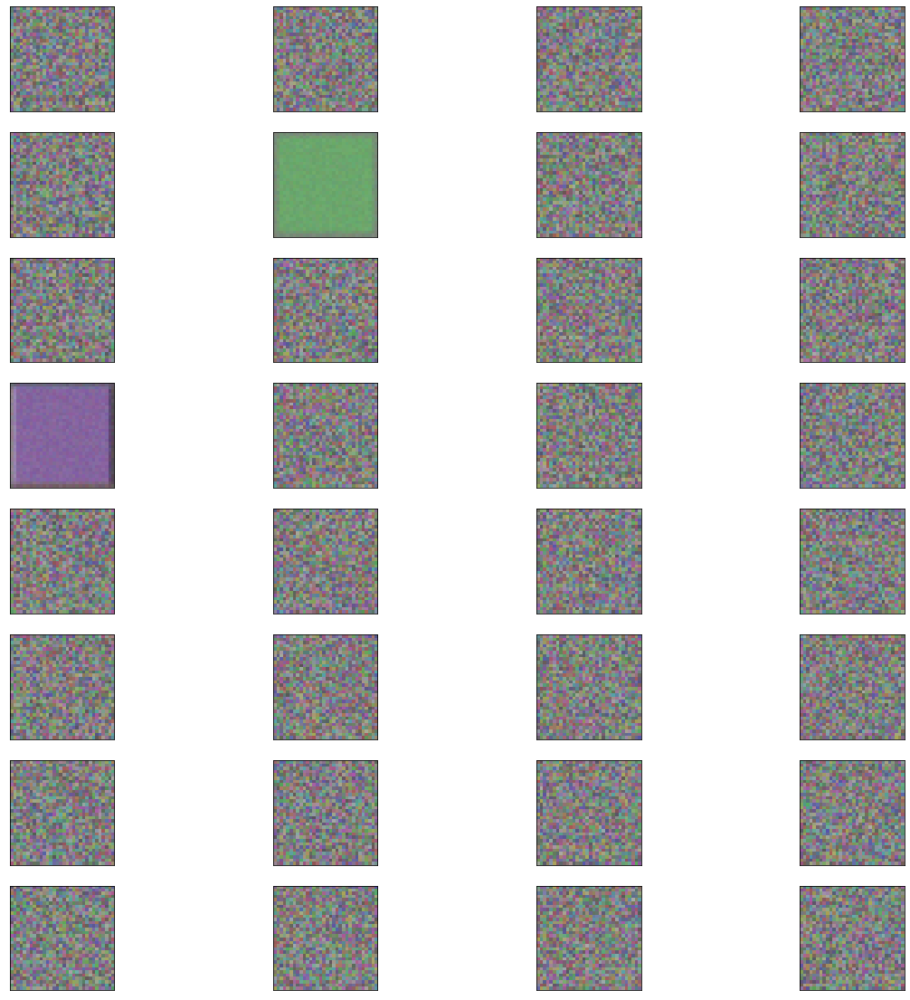

Tensor("activation_2/Relu:0", shape=(None, 72, 72, 64), dtype=float32)
64
(8, 8)


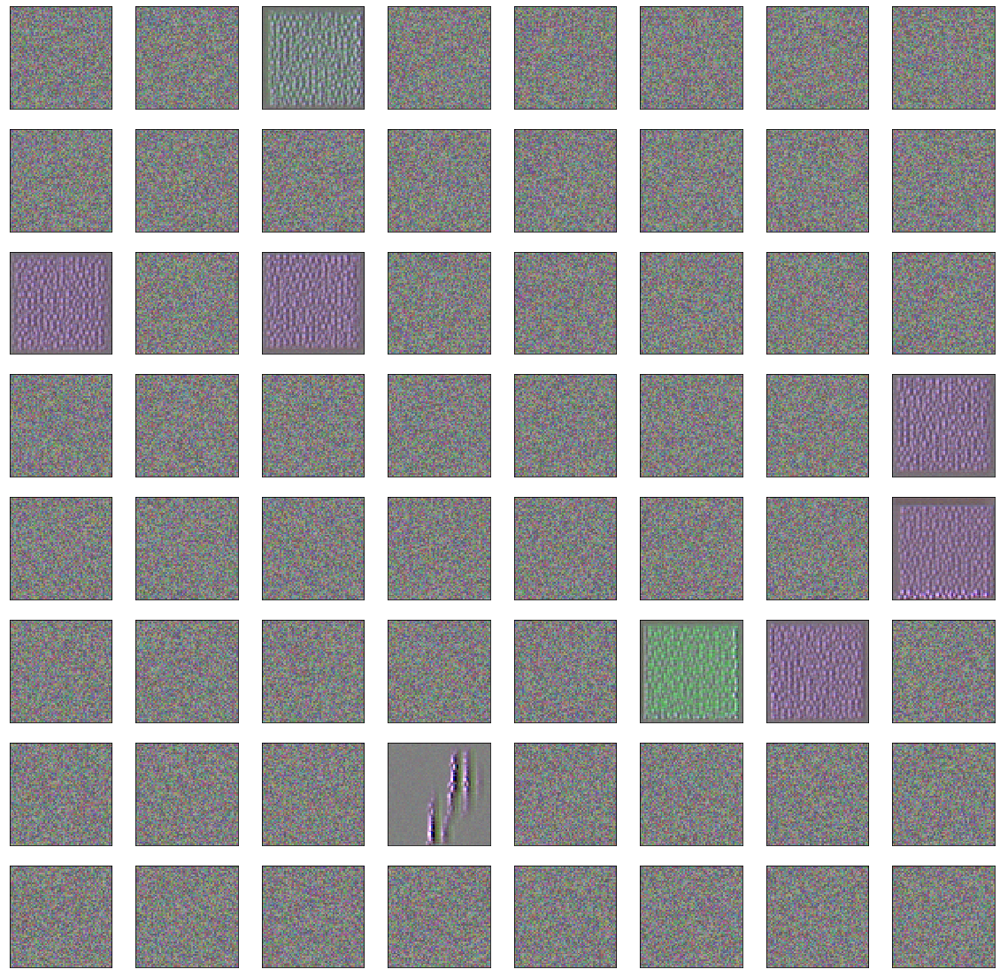

Tensor("activation_3/Relu:0", shape=(None, 34, 34, 128), dtype=float32)
128
(16, 8)


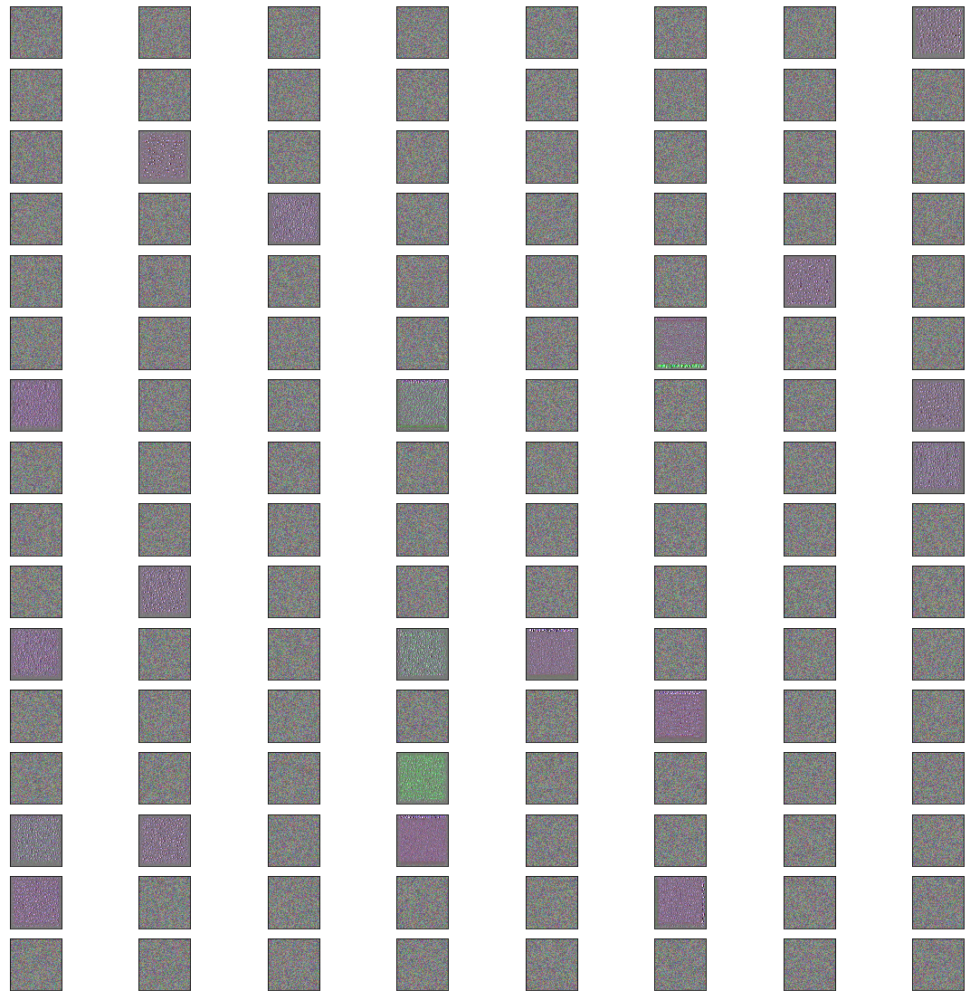

Tensor("activation_4/Relu:0", shape=(None, 15, 15, 128), dtype=float32)
128
(16, 8)


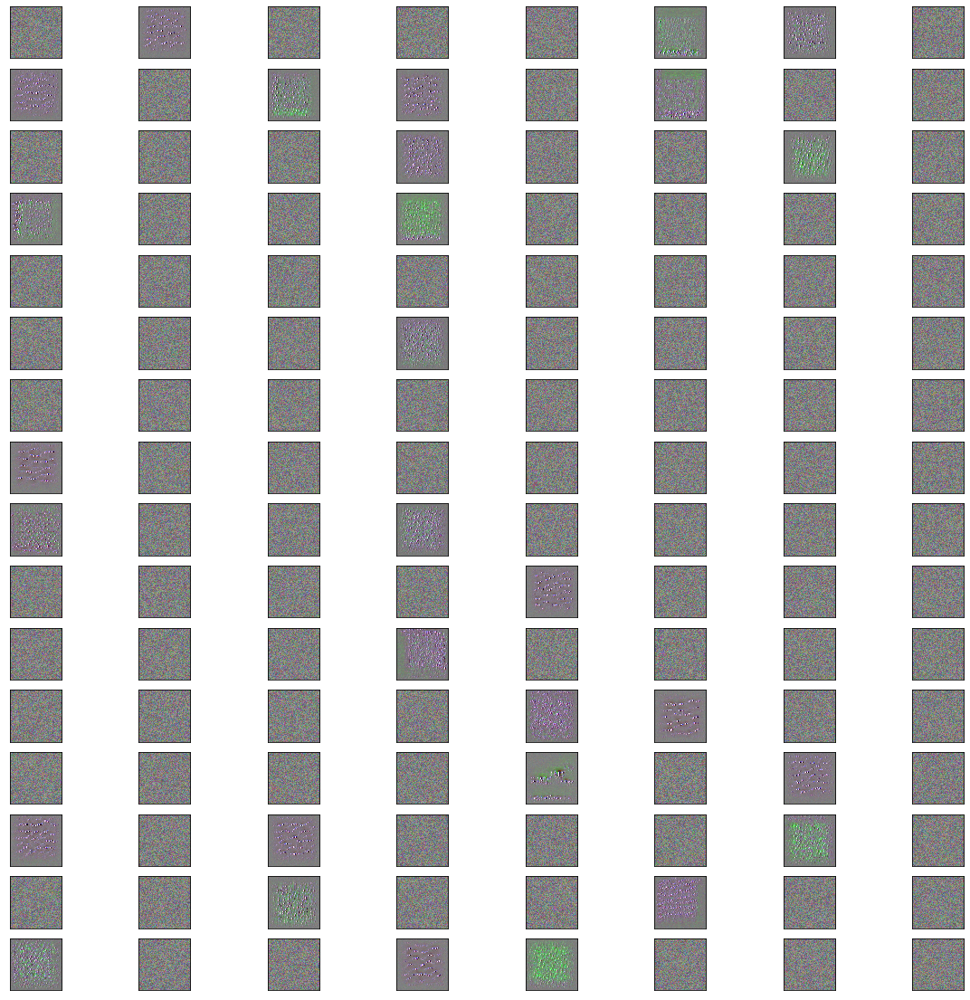

In [18]:
# plot the filters for convolutional layers utilizing gradient decompositiong
sizes = [32,64,128,128]
num_rows_and_columns = [(8,4),(8,8),(16,8),(16,8),(16,8),(16,8)]
index = 1
for layer_name, size, c_and_n in zip(layer_names[1:14:4], sizes, num_rows_and_columns):
    print(model.get_layer(layer_name).output)
    print(size)
    print(c_and_n)
    plt.figure(figsize=(20,20), facecolor='w')
    plt.title(layer_name)
    for i in range(size):
        filter_img = generate_pattern(layer_name, i, size=size)
        plt.subplot(c_and_n[0],c_and_n[1],index)
        plt.imshow(filter_img)
        plt.xticks([])
        plt.yticks([])
        index = index + 1
    index = 1
    plt.show()